MARKOV ICL - REGRESSION
D=1, N=1, z_dim=2, nodes=10
Method: direct_solve
Markov regression head: linear (mlp_depth=2, mlp_width=32)
Baselines enabled: add_mlp=True (depth=3, width=32, dropout=0.0, activation=relu)
Device: cpu

Generating regression data...

Creating model(s)...
  Initialized Markov ICL Regression model (N=1)
  Context/regression scorer: linear
  Parameters: 510
  Initialized MLP ICL Regression model (N=1, z_dim=2, depth=3, width=32, activation=relu, dropout=0.0)
  Parameters: 1,249

Training...
Epoch  10 | MARKOV Train/Val MSE: 0.290700/0.286252 | MARKOV Val MAE: 0.261835 | MLP Train/Val MSE: 0.118384/0.133448 | MLP Val MAE: 0.165295
Epoch  20 | MARKOV Train/Val MSE: 0.139967/0.173569 | MARKOV Val MAE: 0.169488 | MLP Train/Val MSE: 0.107004/0.122572 | MLP Val MAE: 0.164599
Epoch  30 | MARKOV Train/Val MSE: 0.102716/0.128653 | MARKOV Val MAE: 0.148348 | MLP Train/Val MSE: 0.102240/0.100808 | MLP Val MAE: 0.158692
Epoch  40 | MARKOV Train/Val MSE: 0.091246/0.113027 | MAR

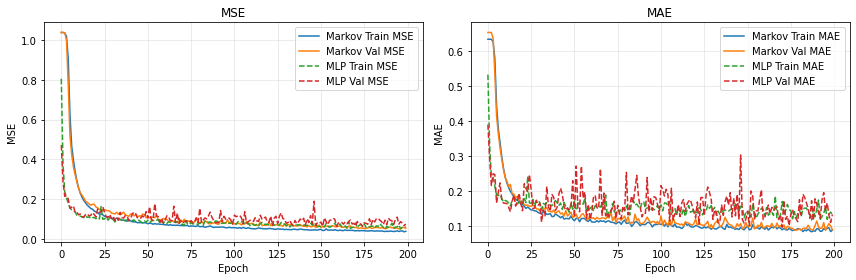


REGRESSION SUMMARY
Markov Final Val MSE: 0.053194
Markov Final Val MAE: 0.089176
Markov Test MSE:      0.044092
Markov Test MAE:      0.080903
----------------------------------------------------------------------
MLP Final Val MSE:    0.074180
MLP Final Val MAE:    0.132360
MLP Test MSE:         0.068476
MLP Test MAE:         0.122704


In [1]:
# Import from regression modules
import torch
import numpy as np
import time
from torch.utils.data import DataLoader

from data_generation_regression import generate_icl_regression_data
from datasets_regression import ICLRegressionDataset, collate_fn_regression
from models import MatrixTreeMarkovICLRegression, MLPICLRegression
from training_regression import train_model_regression, train_models_joint_regression
from evaluation_regression import test_regression

# ============================================================
# Data Parameters (Regression)
# ============================================================
D = 1                        # x-dimension
N = 1                        # number of context examples
noise_std = 0.0              # observation noise
task_scale = 1.0             # latent task weight scale
y_pad = 0.0                  # placeholder query y value
seed = 5

# ============================================================
# Model Parameters
# ============================================================
n_nodes = 10
z_dim = D + 1                # token is [x, y]
transform_func = "exp"
learn_base_rates = True
context_scorer_type = "linear"   # "linear" or "mlp" (Markov regression head)
mlp_depth = 2
mlp_width = 32

# Optional side-by-side MLP baseline
add_mlp = True
mlp_baseline_depth = 3
mlp_baseline_width = 32
mlp_baseline_dropout = 0.0
mlp_baseline_activation = "relu"

# ============================================================
# Sparsity Parameters
# ============================================================
sparsity_rho_edge = 1.0
sparsity_rho_all = 1.0
sparsity_rho_edge_base_W = 1.0
base_mask_value = float("-inf")

# ============================================================
# Training Parameters
# ============================================================
epochs = 200
lr = 0.01
batch_size = 100
train_samples = 5000
val_samples = 5000

# ============================================================
# Inference Parameters
# ============================================================
method = "direct_solve"

params = {
    "D": D,
    "N": N,
    "noise_std": noise_std,
    "task_scale": task_scale,
    "y_pad": y_pad,
    "seed": seed,
    "n_nodes": n_nodes,
    "z_dim": z_dim,
    "transform_func": transform_func,
    "learn_base_rates": learn_base_rates,
    "context_scorer_type": context_scorer_type,
    "mlp_depth": mlp_depth,
    "mlp_width": mlp_width,
    "add_mlp": add_mlp,
    "mlp_baseline_depth": mlp_baseline_depth,
    "mlp_baseline_width": mlp_baseline_width,
    "mlp_baseline_dropout": mlp_baseline_dropout,
    "mlp_baseline_activation": mlp_baseline_activation,
    "sparsity_rho_edge": sparsity_rho_edge,
    "sparsity_rho_all": sparsity_rho_all,
    "sparsity_rho_edge_base_W": sparsity_rho_edge_base_W,
    "base_mask_value": base_mask_value,
    "epochs": epochs,
    "lr": lr,
    "batch_size": batch_size,
    "train_samples": train_samples,
    "val_samples": val_samples,
    "method": method,
}

print("=" * 70)
print("MARKOV ICL - REGRESSION")
print("=" * 70)
print(f"D={D}, N={N}, z_dim={z_dim}, nodes={n_nodes}")
print(f"Method: {method}")
print(f"Markov regression head: {context_scorer_type} (mlp_depth={mlp_depth}, mlp_width={mlp_width})")
print(
    f"Baselines enabled: add_mlp={add_mlp} "
    f"(depth={mlp_baseline_depth}, width={mlp_baseline_width}, "
    f"dropout={mlp_baseline_dropout}, activation={mlp_baseline_activation})"
)
print("=" * 70)

torch.manual_seed(seed)
np.random.seed(seed)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device}\n")

# Generate data
print("Generating regression data...")
train_data = generate_icl_regression_data(
    n_samples=train_samples,
    N=N,
    D=D,
    noise_std=noise_std,
    task_scale=task_scale,
    y_pad=y_pad,
    seed=seed,
)
val_data = generate_icl_regression_data(
    n_samples=val_samples,
    N=N,
    D=D,
    noise_std=noise_std,
    task_scale=task_scale,
    y_pad=y_pad,
)

train_loader = DataLoader(
    ICLRegressionDataset(train_data),
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn_regression,
)
val_loader = DataLoader(
    ICLRegressionDataset(val_data),
    batch_size=batch_size,
    collate_fn=collate_fn_regression,
)

# Create models
print("\nCreating model(s)...")
markov_model = MatrixTreeMarkovICLRegression(
    n_nodes=n_nodes,
    z_dim=z_dim,
    N=N,
    learn_base_rates=learn_base_rates,
    transform_func=transform_func,
    sparsity_rho_edge=sparsity_rho_edge,
    sparsity_rho_all=sparsity_rho_all,
    sparsity_rho_edge_base_W=sparsity_rho_edge_base_W,
    base_mask_value=base_mask_value,
    context_scorer_type=context_scorer_type,
    mlp_depth=mlp_depth,
    mlp_width=mlp_width,
)

models_to_train = {"markov": markov_model}
if add_mlp:
    models_to_train["mlp"] = MLPICLRegression(
        z_dim=z_dim,
        N=N,
        depth=mlp_baseline_depth,
        hidden_width=mlp_baseline_width,
        dropout=mlp_baseline_dropout,
        activation=mlp_baseline_activation,
    )

# Train
start_time = time.time()
print("\nTraining...")
print("=" * 70)

if add_mlp:
    history = train_models_joint_regression(
        models=models_to_train,
        train_loader=train_loader,
        val_loader=val_loader,
        device=device,
        n_epochs=epochs,
        lr=lr,
        method=method,
    )
else:
    history = train_model_regression(
        model=markov_model,
        train_loader=train_loader,
        val_loader=val_loader,
        device=device,
        n_epochs=epochs,
        lr=lr,
        method=method,
    )

end_time = time.time()
print(f"Training time: {end_time - start_time:.2f} seconds")

# Test
if add_mlp:
    results = {}
    for name, model in models_to_train.items():
        torch.manual_seed(seed)
        np.random.seed(seed)
        results[name] = test_regression(
            model=model,
            N=N,
            D=D,
            device=device,
            n_samples=1000,
            noise_std=noise_std,
            task_scale=task_scale,
            y_pad=y_pad,
            method=method,
        )
else:
    results = test_regression(
        model=markov_model,
        N=N,
        D=D,
        device=device,
        n_samples=1000,
        noise_std=noise_std,
        task_scale=task_scale,
        y_pad=y_pad,
        method=method,
    )

# Optional plotting
try:
    import matplotlib.pyplot as plt

    if add_mlp:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))

        axes[0].plot(history["markov"]["train_mse"], label="Markov Train MSE")
        axes[0].plot(history["markov"]["val_mse"], label="Markov Val MSE")
        axes[0].plot(history["mlp"]["train_mse"], "--", label="MLP Train MSE")
        axes[0].plot(history["mlp"]["val_mse"], "--", label="MLP Val MSE")
        axes[0].set_title("MSE")
        axes[0].set_xlabel("Epoch")
        axes[0].set_ylabel("MSE")
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        axes[1].plot(history["markov"]["train_mae"], label="Markov Train MAE")
        axes[1].plot(history["markov"]["val_mae"], label="Markov Val MAE")
        axes[1].plot(history["mlp"]["train_mae"], "--", label="MLP Train MAE")
        axes[1].plot(history["mlp"]["val_mae"], "--", label="MLP Val MAE")
        axes[1].set_title("MAE")
        axes[1].set_xlabel("Epoch")
        axes[1].set_ylabel("MAE")
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        print("\n" + "=" * 70)
        print("REGRESSION SUMMARY")
        print("=" * 70)
        print(f"Markov Final Val MSE: {history['markov']['val_mse'][-1]:.6f}")
        print(f"Markov Final Val MAE: {history['markov']['val_mae'][-1]:.6f}")
        print(f"Markov Test MSE:      {results['markov']['mse']:.6f}")
        print(f"Markov Test MAE:      {results['markov']['mae']:.6f}")
        print("-" * 70)
        print(f"MLP Final Val MSE:    {history['mlp']['val_mse'][-1]:.6f}")
        print(f"MLP Final Val MAE:    {history['mlp']['val_mae'][-1]:.6f}")
        print(f"MLP Test MSE:         {results['mlp']['mse']:.6f}")
        print(f"MLP Test MAE:         {results['mlp']['mae']:.6f}")
        print("=" * 70)

    else:
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))

        axes[0].plot(history["train_mse"], label="Train MSE")
        axes[0].plot(history["val_mse"], label="Val MSE")
        axes[0].set_title("MSE")
        axes[0].set_xlabel("Epoch")
        axes[0].set_ylabel("MSE")
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        axes[1].plot(history["train_mae"], label="Train MAE")
        axes[1].plot(history["val_mae"], label="Val MAE")
        axes[1].set_title("MAE")
        axes[1].set_xlabel("Epoch")
        axes[1].set_ylabel("MAE")
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.tight_layout()
        plt.show()

        print("\n" + "=" * 70)
        print("REGRESSION SUMMARY")
        print("=" * 70)
        print(f"Final Val MSE: {history['val_mse'][-1]:.6f}")
        print(f"Final Val MAE: {history['val_mae'][-1]:.6f}")
        print(f"Test MSE:      {results['mse']:.6f}")
        print(f"Test MAE:      {results['mae']:.6f}")
        print("=" * 70)

except ImportError:
    print("\nInstall matplotlib for plots.")

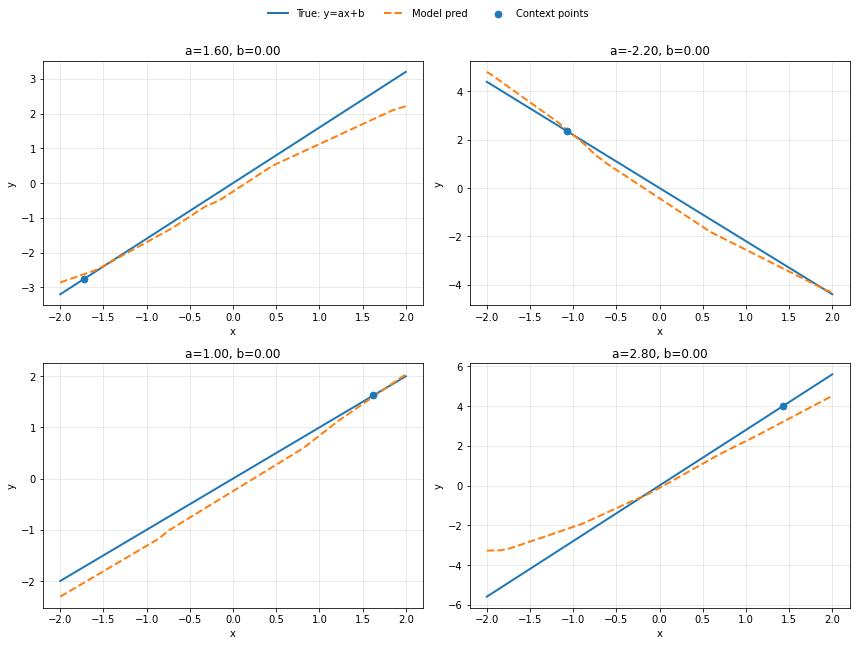

In [16]:
# ============================================================
# Linear-only in-context function visualization
# ============================================================
# Assumes you've already trained:
# - model
# - and defined: D, N, y_pad, method, device

import numpy as np
import torch
import matplotlib.pyplot as plt
import plotly.graph_objects as go

assert D == 1, "This plotting block assumes D=1 for curve visualization."


def make_linear_episode(a, b, N=4, x_range=(-2.0, 2.0), y_pad=0.0, query_grid_size=250):
    """
    Build one episode from y = a*x + b.
    Context tokens: [x_i, y_i]
    Query token:    [x_q, y_pad]
    """
    x_min, x_max = x_range

    # Context
    x_ctx = torch.empty(N, 1).uniform_(x_min, x_max)
    y_ctx = a * x_ctx.squeeze(1) + b

    # Query grid
    xq = torch.linspace(x_min, x_max, query_grid_size).unsqueeze(1)
    y_true = a * xq.squeeze(1) + b

    # Build batched z_seq over all query x values
    z_context = torch.cat([x_ctx, y_ctx.unsqueeze(1)], dim=1)  # (N, 2)
    z_batch = []
    for i in range(query_grid_size):
        z_query = torch.tensor([xq[i, 0].item(), y_pad], dtype=z_context.dtype)
        z_seq = torch.cat([z_context, z_query.unsqueeze(0)], dim=0)  # (N+1, 2)
        z_batch.append(z_seq)
    z_batch = torch.stack(z_batch, dim=0)  # (Q, N+1, 2)

    return x_ctx.squeeze(1), y_ctx, xq.squeeze(1), y_true, z_batch


@torch.no_grad()
def predict_curve(model, z_batch, device, method="direct_solve"):
    model.eval()
    return model(z_batch.to(device), method=method).cpu()


@torch.no_grad()
def prediction_volume_last_ctx_and_query(
    model,
    a,
    b,
    *,
    N,
    y_pad,
    device,
    method,
    x_range=(-2.0, 2.0),
    grid_n=22,
    dtype=torch.float32,
):
    """
    3D scalar field F(x_ctx, y_ctx, x_q): model prediction when the *last* context
    token is (x_ctx, y_ctx) and the query x is x_q. Earlier context tokens (0..N-2)
    are fixed on the line y = a*x + b so the episode stays on-task.

    Axes match your naming: X = last context x, Y = last context y, Z = query x.
    """
    x_min, x_max = x_range
    xs = torch.linspace(x_min, x_max, grid_n, dtype=dtype)
    ys = torch.linspace(x_min, x_max, grid_n, dtype=dtype)
    zs = torch.linspace(x_min, x_max, grid_n, dtype=dtype)
    X, Y, Z = torch.meshgrid(xs, ys, zs, indexing="ij")

    if N > 1:
        x_pre = torch.empty(N - 1, 1, dtype=dtype).uniform_(x_min, x_max)
        y_pre = a * x_pre.squeeze(1) + b
        prefix = torch.cat([x_pre, y_pre.unsqueeze(1)], dim=1)  # (N-1, 2)
    else:
        prefix = torch.empty(0, 2, dtype=dtype)

    flat = X.numel()
    Xv = X.reshape(-1)
    Yv = Y.reshape(-1)
    Zv = Z.reshape(-1)

    parts = []
    if prefix.shape[0] > 0:
        parts.append(prefix.unsqueeze(0).expand(flat, -1, -1))
    last_ctx = torch.stack([Xv, Yv], dim=-1).unsqueeze(1)  # (flat, 1, 2)
    parts.append(last_ctx)
    query = torch.stack([Zv, torch.full_like(Zv, y_pad, dtype=dtype)], dim=-1).unsqueeze(1)
    parts.append(query)
    z_batch = torch.cat(parts, dim=1)  # (flat, N+1, 2)

    model.eval()
    vals = model(z_batch.to(device), method=method).reshape(grid_n, grid_n, grid_n).cpu().numpy()
    return X.numpy(), Y.numpy(), Z.numpy(), vals


# --- 2D line plots (one random episode per panel) ---
linear_tasks = [
    (0.8, 0),
    (-1.1, 0),
    (0.5, 0),
    (1.4, -0),
]

fig, axes = plt.subplots(2, 2, figsize=(12, 9))
axes = axes.flatten()

for ax, (a, b) in zip(axes, linear_tasks):
    fac = 2
    a = fac * a
    x_ctx, y_ctx, xq, y_true, z_batch = make_linear_episode(
        a=a, b=b, N=N, x_range=(-2, 2), y_pad=y_pad, query_grid_size=250
    )
    y_pred = predict_curve(model, z_batch, device=device, method=method)

    ax.plot(xq.numpy(), y_true.numpy(), lw=2, label="True: y=ax+b")
    ax.plot(xq.numpy(), y_pred.numpy(), "--", lw=2, label="Model pred")
    ax.scatter(x_ctx.numpy(), y_ctx.numpy(), s=45, zorder=3, label="Context points")
    ax.set_title(f"a={a:.2f}, b={b:.2f}")
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.grid(alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=3, frameon=False)
fig.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [3]:
# Analytic demo: isosurface of f = z*(y/x) (unrelated to the regression model).
# For the trained model in 3D, see the Plotly block at the end of the previous cell.

import numpy as np
import plotly.graph_objects as go

# Grid
x = np.linspace(-2, 2, 40)
y = np.linspace(-2, 2, 40)
z = np.linspace(-2, 2, 40)
X, Y, Z = np.meshgrid(x, y, z, indexing="ij")

# Original form with singularity mask
eps = 1e-2
F = np.full_like(X, np.nan, dtype=float)
mask = np.abs(Z) > eps
F[mask] = Z[mask] * (Y[mask] / X[mask])  # equals Y where defined

# Isosurface of f over 3D domain
fig = go.Figure(data=go.Isosurface(
    x=X.ravel(), y=Y.ravel(), z=Z.ravel(),
    value=np.nan_to_num(F, nan=0.0).ravel(),
    isomin=-1.5, isomax=1.5, surface_count=6,
    caps=dict(x_show=False, y_show=False, z_show=False)
))
fig.update_layout(title="f = z*(y/x) over 3D domain")
fig.show()

In [18]:
import numpy as np
import torch
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- knobs ---
a, b = 0.4, 0.0
x_range = (-2.0, 2.0)
grid_n = 50
eps = 1e-2
colorscale = "Viridis"

# --- shared 3D grid (X, Y, Z) = (last ctx x, last ctx y, query x) ---
xs = np.linspace(x_range[0], x_range[1], grid_n, dtype=np.float32)
ys = np.linspace(x_range[0], x_range[1], grid_n, dtype=np.float32)
zs = np.linspace(x_range[0], x_range[1], grid_n, dtype=np.float32)
X, Y, Z = np.meshgrid(xs, ys, zs, indexing="ij")

# --- analytic: Z * (Y / X), mask |Z| > eps ---
F_a = np.full_like(X, np.nan, dtype=np.float64)
m = np.abs(Z) > eps
F_a[m] = Z[m] * (Y[m] / X[m])
F_a[np.abs(X) < eps] = np.nan

# --- model ---
dtype = torch.float32
X_t = torch.from_numpy(X).to(dtype)
Y_t = torch.from_numpy(Y).to(dtype)
Z_t = torch.from_numpy(Z).to(dtype)
flat = X_t.numel()
Xv = X_t.reshape(-1)
Yv = Y_t.reshape(-1)
Zv = Z_t.reshape(-1)

if N > 1:
    x_pre = torch.empty(N - 1, 1, dtype=dtype).uniform_(x_range[0], x_range[1])
    y_pre = a * x_pre.squeeze(1) + b
    prefix = torch.cat([x_pre, y_pre.unsqueeze(1)], dim=1)
else:
    prefix = torch.empty(0, 2, dtype=dtype)

parts = []
if prefix.shape[0] > 0:
    parts.append(prefix.unsqueeze(0).expand(flat, -1, -1))
parts.append(torch.stack([Xv, Yv], dim=-1).unsqueeze(1))
parts.append(torch.stack([Zv, torch.full_like(Zv, float(y_pad))], dim=-1).unsqueeze(1))
z_batch = torch.cat(parts, dim=1)

model.eval()
with torch.no_grad():
    F_m = model(z_batch.to(device), method=method).reshape(grid_n, grid_n, grid_n).cpu().numpy()

# --- shared color limits ---
stack = np.concatenate([F_a.ravel(), F_m.ravel()])
stack = stack[np.isfinite(stack)]
vmin, vmax = np.percentile(stack, [2, 98])
if (not np.isfinite(vmin)) or (not np.isfinite(vmax)) or vmin == vmax:
    vmin = float(np.nanmin(F_m))
    vmax = float(np.nanmax(F_m))

fig = make_subplots(
    rows=1,
    cols=2,
    specs=[[{"type": "scene"}, {"type": "scene"}]],
    subplot_titles=(
        "Analytic: z·(y/x), |z|>eps",
        "Model (last ctx x,y; query x=z)",
    ),
    horizontal_spacing=0.06,
)

iso_kw = dict(
    x=X.ravel(),
    y=Y.ravel(),
    z=Z.ravel(),
    colorscale=colorscale,
    cmin=vmin,
    cmax=vmax,
    surface_count=8,
    caps=dict(x_show=False, y_show=False, z_show=False),
)

fig.add_trace(
    go.Isosurface(
        value=np.nan_to_num(F_a, nan=0.0).ravel(),
        isomin=vmin,
        isomax=vmax,
        showscale=False,
        **iso_kw,
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Isosurface(
        value=np.nan_to_num(F_m, nan=0.0).ravel(),
        isomin=vmin,
        isomax=vmax,
        showscale=True,
        colorbar=dict(title="value", len=0.75, x=1.02, tickformat=".2f"),
        **iso_kw,
    ),
    row=1,
    col=2,
)

axis_titles = ("last ctx x", "last ctx y", "query x")
fig.update_scenes(
    xaxis_title=axis_titles[0],
    yaxis_title=axis_titles[1],
    zaxis_title=axis_titles[2],
    aspectmode="cube",
    row=1,
    col=1,
)
fig.update_scenes(
    xaxis_title=axis_titles[0],
    yaxis_title=axis_titles[1],
    zaxis_title=axis_titles[2],
    aspectmode="cube",
    row=1,
    col=2,
)

fig.update_layout(
    title="Side-by-side 3D isosurfaces (shared colorscale range)",
    height=520,
    margin=dict(l=0, r=80, t=60, b=0),
)
fig.show()

In [2]:
import numpy as np
import torch
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- resolve trained models (prefer models_to_train; avoid markov/mlp alias bugs) ---
_g = globals()
mt = _g.get("models_to_train")

markov = None
mlp = None

if isinstance(mt, dict):
    markov = mt.get("markov")
    mlp = mt.get("mlp")

if markov is None:
    markov = _g.get("markov_model") or _g.get("model")
if mlp is None:
    mlp = _g.get("mlp_model") or _g.get("mlp_baseline")

if markov is None:
    raise RuntimeError(
        "Could not find Markov model: define `models_to_train['markov']`, "
        "`markov_model`, or `model` (Markov only — do not reuse for MLP)."
    )

if mlp is not None and markov is mlp:
    raise RuntimeError(
        "markov and mlp are the same object. Use a separate `MLPICLRegression` in "
        "`models_to_train['mlp']` or set `mlp_model` to that instance — not the Markov module."
    )

have_mlp = mlp is not None
if not have_mlp:
    print(
        "No MLP baseline found (expected `models_to_train['mlp']`, `mlp_model`, or `mlp_baseline`). "
        "Plotting 2 panels only."
    )

# --- knobs ---
a, b = 0.4, 0.0
x_range = (-2.0, 2.0)
grid_n = 50
eps = 1e-2
colorscale = "Viridis"

# --- shared 3D grid (X, Y, Z) = (last ctx x, last ctx y, query x) ---
xs = np.linspace(x_range[0], x_range[1], grid_n, dtype=np.float32)
ys = np.linspace(x_range[0], x_range[1], grid_n, dtype=np.float32)
zs = np.linspace(x_range[0], x_range[1], grid_n, dtype=np.float32)
X, Y, Z = np.meshgrid(xs, ys, zs, indexing="ij")

# --- analytic: Z * (Y / X), mask |Z| > eps ---
F_a = np.full_like(X, np.nan, dtype=np.float64)
m = np.abs(Z) > eps
F_a[m] = Z[m] * (Y[m] / X[m])
F_a[np.abs(X) < eps] = np.nan

# --- build z_batch ---
dtype = torch.float32
X_t = torch.from_numpy(X).to(dtype)
Y_t = torch.from_numpy(Y).to(dtype)
Z_t = torch.from_numpy(Z).to(dtype)
flat = X_t.numel()
Xv = X_t.reshape(-1)
Yv = Y_t.reshape(-1)
Zv = Z_t.reshape(-1)

N_loc = int(_g.get("N", N))
y_pad_loc = float(_g.get("y_pad", y_pad))
device_loc = _g.get("device", device)
method_loc = _g.get("method", method)

if N_loc > 1:
    x_pre = torch.empty(N_loc - 1, 1, dtype=dtype).uniform_(x_range[0], x_range[1])
    y_pre = a * x_pre.squeeze(1) + b
    prefix = torch.cat([x_pre, y_pre.unsqueeze(1)], dim=1)
else:
    prefix = torch.empty(0, 2, dtype=dtype)

parts = []
if prefix.shape[0] > 0:
    parts.append(prefix.unsqueeze(0).expand(flat, -1, -1))
parts.append(torch.stack([Xv, Yv], dim=-1).unsqueeze(1))
parts.append(torch.stack([Zv, torch.full_like(Zv, y_pad_loc, dtype=dtype)], dim=-1).unsqueeze(1))
z_batch = torch.cat(parts, dim=1)
zb = z_batch.to(device_loc)

markov.eval()
if have_mlp:
    mlp.eval()

with torch.no_grad():
    F_m = markov(zb, method=method_loc).reshape(grid_n, grid_n, grid_n).cpu().numpy()
    F_mlp = (
        mlp(zb, method=method_loc).reshape(grid_n, grid_n, grid_n).cpu().numpy()
        if have_mlp
        else None
    )

# --- shared color limits ---
if have_mlp:
    stack = np.concatenate([F_a.ravel(), F_m.ravel(), F_mlp.ravel()])
else:
    stack = np.concatenate([F_a.ravel(), F_m.ravel()])
stack = stack[np.isfinite(stack)]
vmin, vmax = np.percentile(stack, [2, 98])
if (not np.isfinite(vmin)) or (not np.isfinite(vmax)) or vmin == vmax:
    s2 = F_m.ravel()[np.isfinite(F_m.ravel())]
    vmin, vmax = float(np.min(s2)), float(np.max(s2))

cols = 3 if have_mlp else 2
specs = [[{"type": "scene"}] * cols]
titles = (
    "Analytic: z·(y/x), |z|>eps",
    "Markov model",
    "MLP baseline",
) if have_mlp else ("Analytic: z·(y/x), |z|>eps", "Markov model")

fig = make_subplots(
    rows=1,
    cols=cols,
    specs=specs,
    subplot_titles=titles,
    horizontal_spacing=0.04,
)

iso_kw = dict(
    x=X.ravel(),
    y=Y.ravel(),
    z=Z.ravel(),
    colorscale=colorscale,
    cmin=vmin,
    cmax=vmax,
    surface_count=8,
    caps=dict(x_show=False, y_show=False, z_show=False),
)

fig.add_trace(
    go.Isosurface(
        value=np.nan_to_num(F_a, nan=0.0).ravel(),
        isomin=vmin,
        isomax=vmax,
        showscale=False,
        **iso_kw,
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Isosurface(
        value=np.nan_to_num(F_m, nan=0.0).ravel(),
        isomin=vmin,
        isomax=vmax,
        showscale=(not have_mlp),
        colorbar=None
        if have_mlp
        else dict(title="value", len=0.75, x=1.02, tickformat=".2f"),
        **iso_kw,
    ),
    row=1,
    col=2,
)

if have_mlp:
    fig.add_trace(
        go.Isosurface(
            value=np.nan_to_num(F_mlp, nan=0.0).ravel(),
            isomin=vmin,
            isomax=vmax,
            showscale=True,
            colorbar=dict(title="value", len=0.75, x=1.02, tickformat=".2f"),
            **iso_kw,
        ),
        row=1,
        col=3,
    )

axis_titles = ("last ctx x", "last ctx y", "query x")
for col in range(1, cols + 1):
    fig.update_scenes(
        xaxis_title=axis_titles[0],
        yaxis_title=axis_titles[1],
        zaxis_title=axis_titles[2],
        aspectmode="cube",
        row=1,
        col=col,
    )

fig.update_layout(
    title="3D isosurfaces: analytic | Markov"
    + (" | MLP baseline" if have_mlp else "")
    + " (shared colorscale)",
    height=520,
    width=480 * cols,
    margin=dict(l=0, r=100 if have_mlp else 80, t=70, b=0),
)
fig.show()